In [3]:
import pickle
import numpy as np
import seaborn as sns
import pandas as pd
import os

import matplotlib.pyplot as plt
import geopandas as gpd

import tqdm
from sklearn.impute import KNNImputer
from drone_data.utils.plt_functions import plot_multichanels

### Process images

- remove baseline
- add vegetation indexes
- data imputation
- create correlation plots
    - PCA and clustering
    - remove soil
- reduce to a specific spatial dimensions
- export images as array



## config

In [107]:
from drone_data.utils.drone_data import calculate_vi_fromxarray
VEGETATION_INDEX = {# rgb bands
'grvi': '(green_ms - red_ms)/(green_ms + red_ms)',
'grvi_rgb': '(green - red)/((green + red)+0.00001)',
'mgrvi': '((green_ms*green_ms) - (red_ms*red_ms))/((green_ms*green_ms) + (red_ms*red_ms))',
'mgrvi_rgb': '((green*green) - (red*red))/(((green*green) + (red*red))+0.00001)',
'rgbvi': '((green_ms*green_ms) - (blue_ms*red_ms))/ ((green_ms*green_ms) + (blue_ms*red_ms))',
'rgbvi_rgb': '((green*green) - (blue*red))/ (((green*green) + (blue*red))+0.00001)',
 # nir indexes
 'ndvi': '(nir - red_ms)/(nir + red_ms)',
'ndre': '(nir - edge)/(nir + edge)',
'gndvi': '(nir - green_ms)/(nir + green_ms)',
'regnvi': '(edge - green_ms)/(edge + green_ms)',
'reci': '(nir / edge) - 1',
'negvi': '((nir*nir) - (edge*green_ms))/ ((nir*nir) + (edge*green_ms))',
'savi':  '((nir - red_ms) / (nir + red_ms + 0.5)) * (1.5)'}

INPUTFOLDER = "F:/OneDrive - The University of Tokyo/drone_data/results/xarraydata/tanashi/per_polygon/rgb_ms_xyz_rgbreference_27tp/"
SHP_PATH =  "F:/OneDrive - The University of Tokyo/drone_data/results/tanashicropdetection/cc_od_polygons_yolodr5m_tana_ov_65conf_mn_tp.shp"
DATETODELETE = 4
DATESTOSELECT =  list(range(0,DATETODELETE)) + list(range(DATETODELETE+1,27))
SOILKMEANS = "F:/OneDrive - The University of Tokyo/drone_data/results/kmeans_cluster/tanashi/kmeans_5_vi_soil.pickle"


xrfiles = os.listdir(INPUTFOLDER)
xrfiles = [i for i in xrfiles if i.endswith('.pickle')]

In [93]:
i = 589
#i = 325
i = 296
#i = 63
with open(os.path.join(INPUTFOLDER,xrfiles[i]),"rb") as f:
    xrexample= pickle.load(f)


#### baseline calculation

In order to know the true plant height, it is needed to tranform altitude to a local coordinates where z starts in 0. Thus, we first calculate a baseline reference, based on the first drone image, in which is possible to spot the trench in the background. once the groove, altitude is determined, we calculate the difference between current value and the baseline. 

In [96]:
from drone_data.utils.xyz_functions import get_baseline_altitude

In [97]:
xrtest = xrexample.copy()
xrtest.dims['x']
xrtestdf = xrtest.isel(date = 0).to_dataframe()
altref = xrtestdf.reset_index().loc[:,('x','y','z','red_3d','green_3d','blue_3d')].dropna()
bsl = get_baseline_altitude(altref, method='max_probability')
print('trench altitude {} m'.format(bsl))


trench altitude 96.41604232788086 m


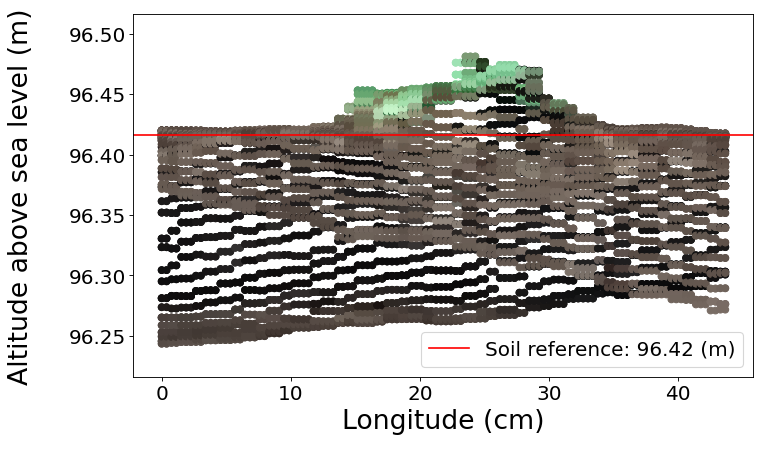

In [9]:
import matplotlib.pyplot as plt

indcolors = [[r/255.,g/255.,b/255.] for r,g,b in zip(
                 altref.iloc[:,3].values, 
                 altref.iloc[:,4].values,
                 altref.iloc[:,5].values)]

plt.figure(figsize=(10, 6), dpi=80)
xaxisvals = altref.iloc[:,1].copy()

plt.scatter((xaxisvals - np.min(xaxisvals)) * 100,
            altref.iloc[:,2],
            c = indcolors)

plt.axhline(y = bsl, color = 'r', linestyle = '-', label = 'Soil reference: {:.2f} (m)'.format(bsl))
plt.ylim(bsl-.2, bsl+.10)
plt.yticks(fontsize=18)
plt.ylabel('Altitude above sea level (m)\n', fontsize=24)

plt.xticks(fontsize=18)
plt.xlabel('Longitude (cm)\n', fontsize=24)


plt.legend(loc="upper left")
plt.legend(fontsize=18)

Text(0.5, 0, 'Longitude (cm)')

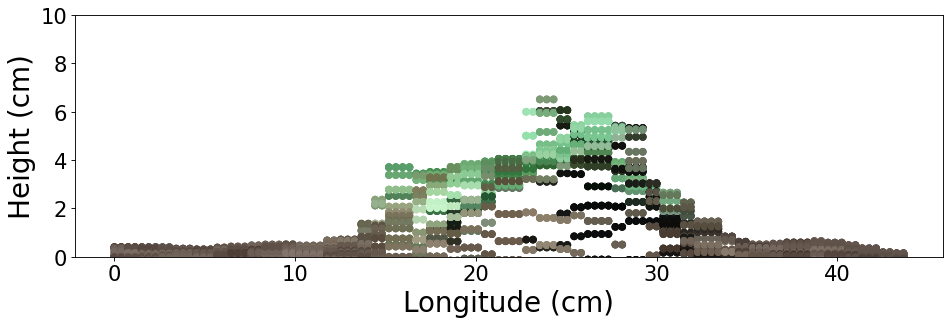

In [10]:
import matplotlib.pyplot as plt

indcolors = [[r/255.,g/255.,b/255.] for r,g,b in zip(
                 altref.iloc[:,3].values, 
                 altref.iloc[:,4].values,
                 altref.iloc[:,5].values)]

plt.figure(figsize=(14, 4), dpi=80)
xaxisvals = altref.iloc[:,1].copy()


zvalues = (altref.iloc[:,2] - bsl) * 100
plt.scatter((xaxisvals - np.min(xaxisvals)) * 100,
            zvalues,
            c = indcolors)

#plt.axhline(y = bsl, color = 'r', linestyle = '-', label = 'Soil reference: {:.2f} (m)'.format(bsl))
plt.ylim(0, 10)
plt.yticks(fontsize=19)
plt.ylabel('Height (cm)', fontsize=25)

plt.xticks(fontsize=19)
plt.xlabel('Longitude (cm)', fontsize=25)


#plt.legend(loc="upper left")
#plt.legend(fontsize=18)

In [12]:
from drone_data.utils.plt_functions import plot_3d_cloudpoints

plot_3d_cloudpoints(xrtest.isel(date = 0).copy(),scale_xy=1)

In [242]:
###


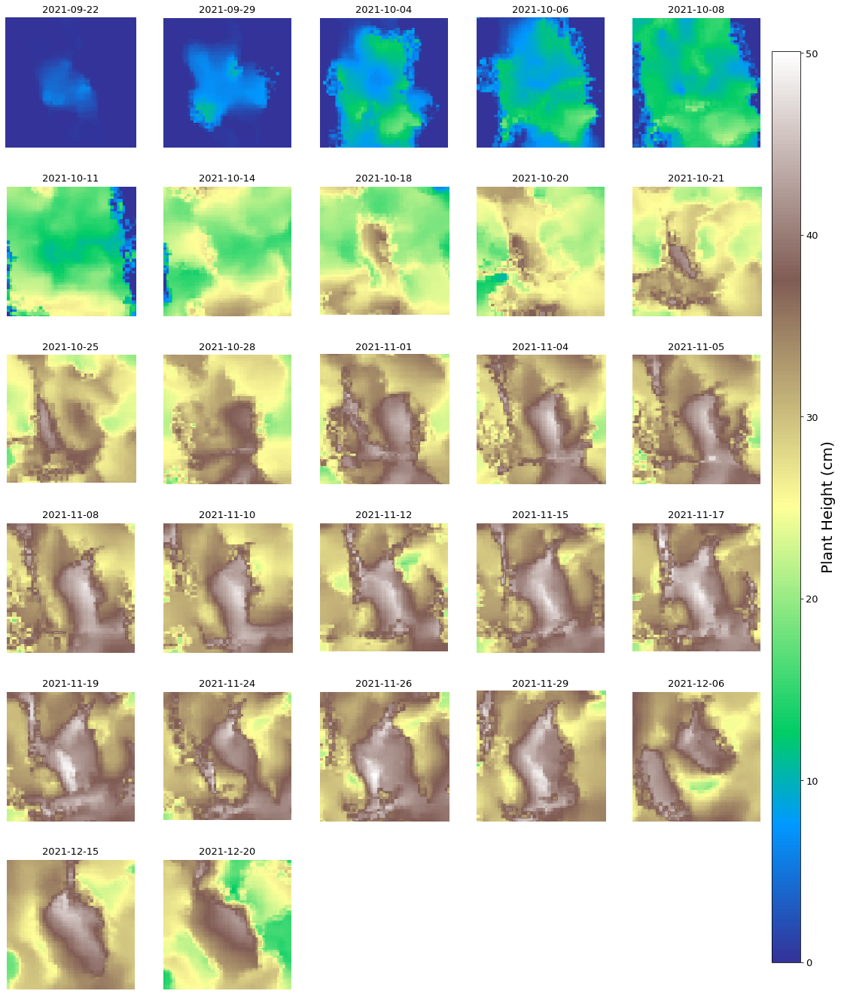

In [13]:


xrtest = xrexample.copy()
xrtest['z'] = (xrtest.z - bsl)*100
xrtest['z'] = xrtest.z.where(np.logical_or(np.isnan(xrtest.z),xrtest.z > 0 ), 0)

datesstr = [np.datetime_as_string(i, unit='D') for i in xrtest.date.values ]
figmod,axmod = plot_multichanels(xrtest.z.values, num_rows= 6, num_columns= 5, cmap = 'terrain',chanels_names=datesstr,
                figsize=(18,24),label_name = 'Plant Height (cm)',legfontsize=20,legtickssize=13,fontsize=13)

### Impute values related to 3d metrics

Due to the grid size used for obtainen the image, there are certain regions which were not covered by the cloud points, to fill those gaps we are going to apply an imputation function in this case KNN
https://scikit-learn.org/stable/modules/generated/sklearn.impute.KNNImputer.html

In [14]:
from drone_data.utils.gis_functions import impute_4dxarray

xrtestfilled = impute_4dxarray(xrtest, bandstofill=['z'],nabandmaskname='red',n_neighbors=5)


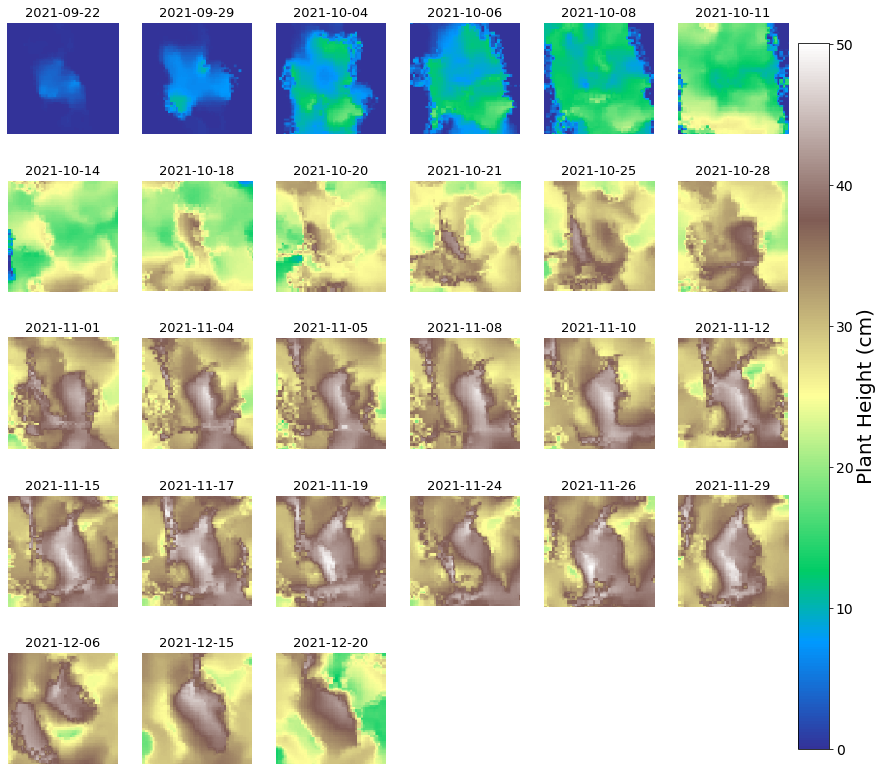

In [15]:
datesstr = [np.datetime_as_string(i, unit='D') for i in xrtest.date.values ]
figmod,axmod = plot_multichanels(xrtestfilled.z.values, num_rows= 5, num_columns= 6, cmap = 'terrain',chanels_names=datesstr,
                figsize=(14,14),label_name = 'Plant Height (cm)',legfontsize=20,legtickssize=14,fontsize=13)

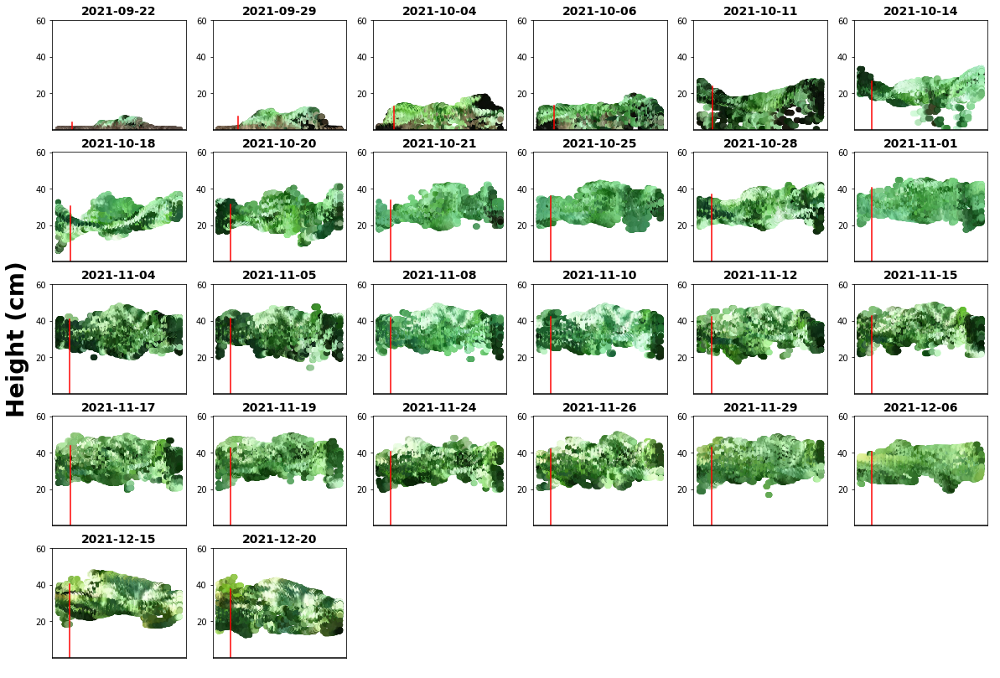

In [16]:
from drone_data.utils.plt_functions import plot_heights

xrtest = xrexample.copy()
xrtest.dims['x']
xrtestdf = xrtest.isel(date = 0).to_dataframe()
altref = xrtestdf.reset_index().loc[:,('x','y','z','red_3d','green_3d','blue_3d')].dropna()
bsl = get_baseline_altitude(altref, method='max_probability')

f,a = plot_heights(xrexample.isel(date = list(range(0,4)) + list(range(5,len(xrexample.date.values)))).copy(), num_rows= 5, num_columns= 6,figsize=(20,14), bsl = bsl,fontsize=14,
                     phquantile = 0.9)

In [62]:
f.savefig('tmp/plotheight.jpg',dpi=1200)


#### Leaf Angle

This is going to be calculated using a vector located in the center of the image, then an angle will be determined from center to each 3d point

In [17]:
from drone_data.utils.xyz_functions import calculate_leaf_angle
xrtestfilledleaf_angle = calculate_leaf_angle(xrtestfilled, invert=True)

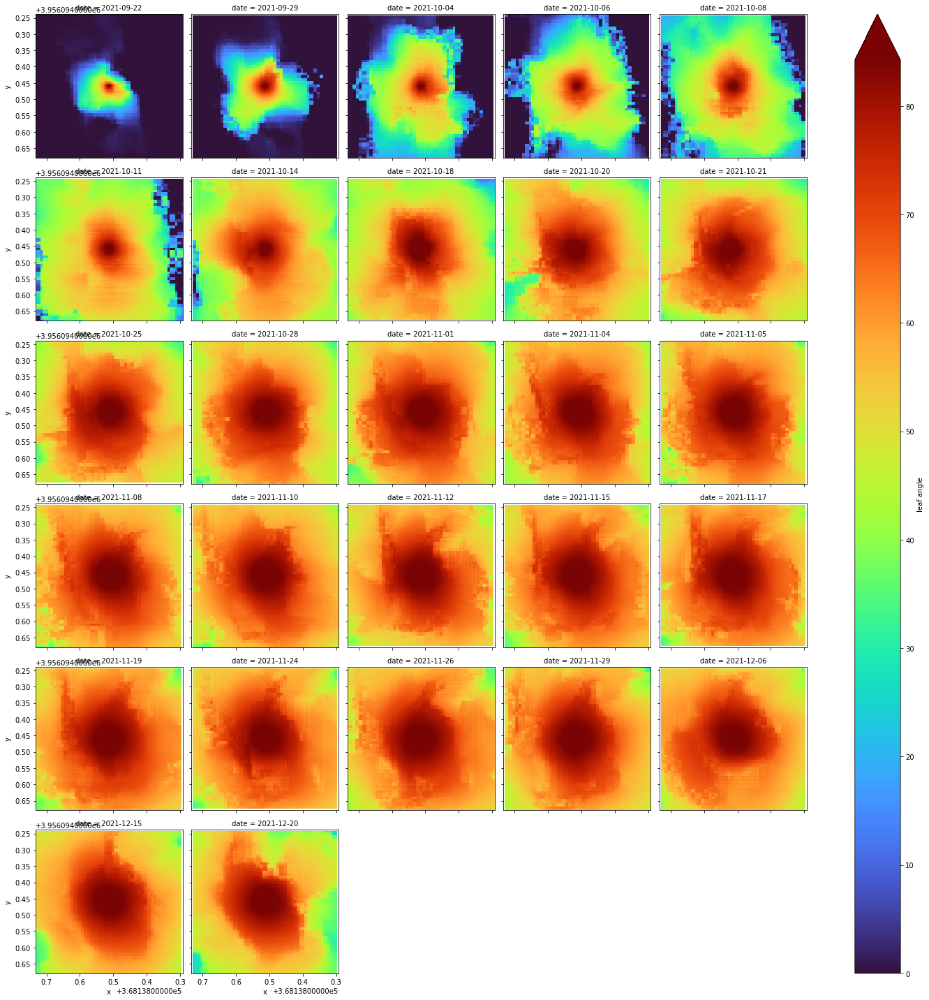

In [18]:
g = xrtestfilledleaf_angle.leaf_angle.plot.pcolormesh( "x",
"y", col="date", col_wrap=5, robust=True, cmap="turbo", vmin = 0, figsize = [20,20],
cbar_kwargs={"label": "leaf angle"},
)
plt.gca().invert_yaxis()
plt.gca().invert_xaxis()

#### RGB: histogram equalization

increase the contrast in the image
https://en.wikipedia.org/wiki/Histogram_equalization

In [19]:
from drone_data.utils.image_functions import hist_equalization
from drone_data.utils.gis_functions import hist_ndxarrayequalization

from matplotlib import pyplot as plt

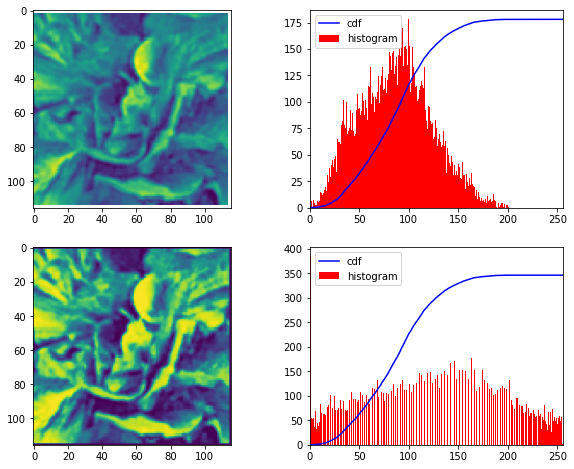

In [20]:

img = xrexample.red.isel(date = 10).values
hist,bins = np.histogram(img.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()
fig, ax = plt.subplots(nrows = 2,ncols = 2,figsize = (10,8))
ax[0,1].plot(cdf_normalized, color = 'b')
ax[0,0].imshow(img)
ax[0,1].hist(img.flatten(),256,[0,256], color = 'r')
ax[0,1].set_xlim([0,256])
ax[0,1].legend(('cdf','histogram'), loc = 'upper left')
hist,bins = np.histogram(img.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()
cdf_m = np.ma.masked_equal(cdf,0)
cdf_m = (cdf_m - cdf_m.min())*255/(cdf_m.max()-cdf_m.min())
cdf = np.ma.filled(cdf_m,0).astype('uint8')
img2 = hist_equalization(img)
ax[1,0].imshow(img2)
hist2,bins2 = np.histogram(img.flatten(),256,[0,256])
cdf2 = hist.cumsum()
cdf_normalized2 = cdf2 * float(hist2.max()) / cdf2.max()
ax[1,1].plot(cdf_normalized2, color = 'b')
ax[1,1].hist(img2.flatten(),256,[0,256], color = 'r')
ax[1,1].set_xlim([0,256])
ax[1,1].legend(('cdf','histogram'), loc = 'upper left')


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


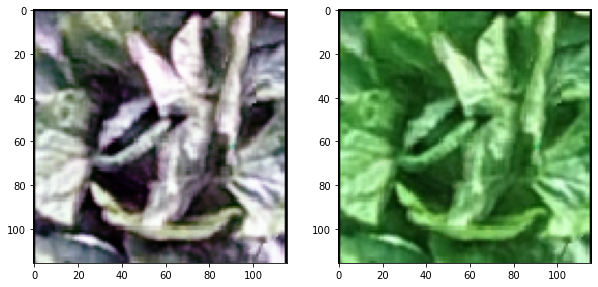

In [21]:
dateoi = 20
img = xrexample.isel(date = dateoi)[['red','green','blue']].to_array().values

xrtest = hist_ndxarrayequalization(xrexample, bands = ['red','green','blue'])
mex = xrtest.isel(date = dateoi)[['red_eq','green_eq','blue_eq']].to_array().values

fig, ax = plt.subplots(nrows=1,ncols = 2, figsize = (10,5))

ax[0].imshow(mex.swapaxes(0,1).swapaxes(1,2).astype(int))
ax[1].imshow(img.swapaxes(0,1).swapaxes(1,2).astype(int))


### vegetation indexes
https://www.sciencedirect.com/science/article/pii/S0303243415000446
https://www.mdpi.com/2072-4292/11/13/1548/htm#B33-remotesensing-11-01548
- GRVI: [Red and photographic infrared linear combinations for monitoring vegetation](https://www.sciencedirect.com/science/article/pii/0034425779900130)$$\frac{green - red}{green + red}$$
- MGRVI: [modified green red vegetation index](https://www.sciencedirect.com/science/article/pii/S0303243415000446)$$ \frac{green^2 - red^2}{green^2 + red^2} $$
- RGBVI: [Red Green Blue Vegetation Index](https://www.sciencedirect.com/science/article/pii/S0303243415000446)$$ \frac{(green^2) - (blue*red)}{(green^2) + (blue * red)} $$
- NDVI: [normalized difference vegetation index](https://books.google.co.jp/books?hl=en&lr=&id=e00CAAAAIAAJ&oi=fnd&pg=PA309&ots=JTQteVFm-b&sig=3JNqoOLVGDRe1LNfodW_3T7K9uI&redir_esc=y#v=onepage&q&f=false)$$\frac{nir - red}{red + nir}$$
- NDRE: [normalized difference red edge index](https://www.sciencedirect.com/science/article/pii/S0176161704704034?via%3Dihub)$$\frac{nir - edge}{red + edge}$$
- GNDVI: [green normalized difference vegetation index](https://www.sciencedirect.com/science/article/pii/S0176161704704034?via%3Dihub)$$\frac{nir - green}{red + green}$$
- RECI: [red edge chlorophyll index](https://www.sciencedirect.com/science/article/pii/S0176161704704034?via%3Dihub)$$(\frac{nir}{edge} - 1)$$
- RECI: nir - rededge - green index $$ \frac{(nir^2) - (edge*green)}{(nir^2) + (edge * green)} $$

In [102]:

xrtestvi = xrtest.copy()

import random
idpol = 524
vilist= ['grvi', 'mgrvi','rgbvi','grvi_rgb','mgrvi_rgb', 'rgbvi_rgb', 'ndvi','savi', 'ndre', 'gndvi', 'reci','negvi', 'regnvi']
datacor = []
for i in tqdm.tqdm(random.sample(list(range(len(xrfiles))), 50)):
    xrfile = xrfiles[i]
    
    with open(os.path.join(INPUTFOLDER,xrfile),"rb") as f:
        xrtest= pickle.load(f)

    xrtestvi = xrtest.copy()
    for vi in vilist:
        
        xrtestvi = calculate_vi_fromxarray(xrtestvi,vi = vi,expression = VEGETATION_INDEX[vi])
        
    xrcorrplot = xrtestvi[vilist].copy()
    datacor.append(xrcorrplot.to_dataframe().dropna().drop(['spatial_ref'],axis = 1))

100%|██████████| 50/50 [00:20<00:00,  2.44it/s]


In [26]:
pd.concat(datacor).to_csv('vicorrplot/corplotdata_ms.csv')

(<Figure size 936x1008 with 17 Axes>,
 array([[<AxesSubplot:title={'center':'GRVI'}>,
         <AxesSubplot:title={'center':'MGRVI'}>,
         <AxesSubplot:title={'center':'RGBVI'}>,
         <AxesSubplot:title={'center':'GRVI_RGB'}>],
        [<AxesSubplot:title={'center':'MGRVI_RGB'}>,
         <AxesSubplot:title={'center':'RGBVI_RGB'}>,
         <AxesSubplot:title={'center':'NDVI'}>,
         <AxesSubplot:title={'center':'SAVI'}>],
        [<AxesSubplot:title={'center':'NDRE'}>,
         <AxesSubplot:title={'center':'GNDVI'}>,
         <AxesSubplot:title={'center':'RECI'}>,
         <AxesSubplot:title={'center':'NEGVI'}>],
        [<AxesSubplot:title={'center':'REGNVI'}>, <AxesSubplot:>,
         <AxesSubplot:>, <AxesSubplot:>]], dtype=object))

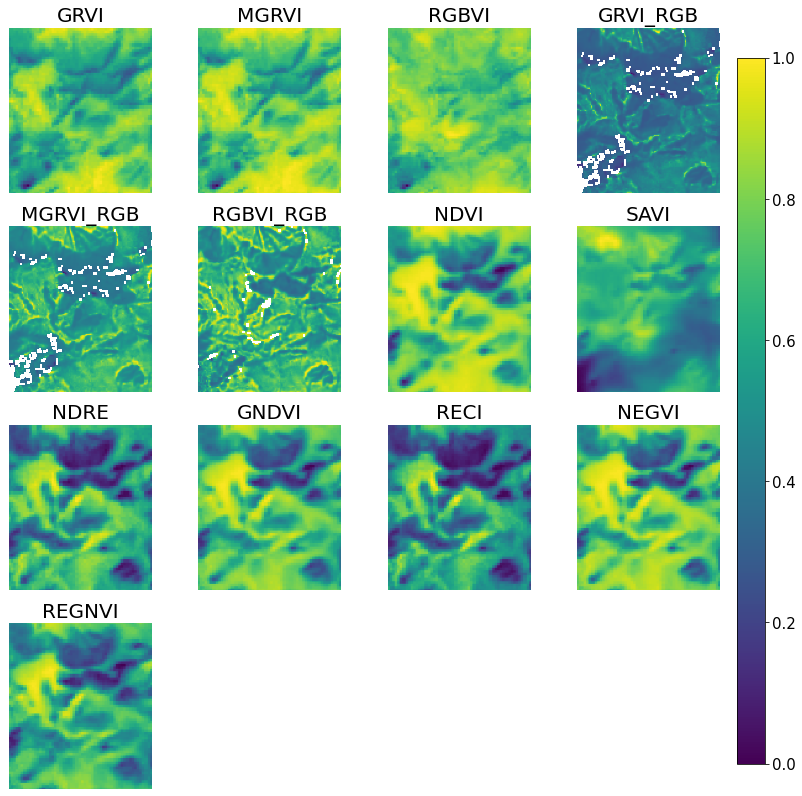

In [103]:
from drone_data.utils.plt_functions import plot_multibands,plot_multichanels,minmax_xarray

i = 852
xrfile = xrfiles[i]

with open(os.path.join(INPUTFOLDER,xrfile),"rb") as f:
    xrtest= pickle.load(f)

xrtestvi = xrtest.copy()
for vi in vilist:
    xrtestvi = calculate_vi_fromxarray(xrtestvi,vi = vi,expression = VEGETATION_INDEX[vi])
    
plot_multichanels(minmax_xarray(xrtestvi[vilist].isel(date = 26)).to_array().values, figsize= (13,14),
                                num_rows= 4, num_columns=4, fontsize=20, chanels_names = [viname.upper() for viname in vilist])

#### Filtering by correlation

Some of the vegetation indexes have a strong correlation among each other, so we picked up one from those variables with a correlation greater than .96

[Text(0.5, 0, 'grvi'),
 Text(1.5, 0, 'mgrvi'),
 Text(2.5, 0, 'rgbvi'),
 Text(3.5, 0, 'grvi_rgb'),
 Text(4.5, 0, 'mgrvi_rgb'),
 Text(5.5, 0, 'rgbvi_rgb'),
 Text(6.5, 0, 'ndvi'),
 Text(7.5, 0, 'savi'),
 Text(8.5, 0, 'ndre'),
 Text(9.5, 0, 'gndvi'),
 Text(10.5, 0, 'reci'),
 Text(11.5, 0, 'negvi'),
 Text(12.5, 0, 'regnvi')]

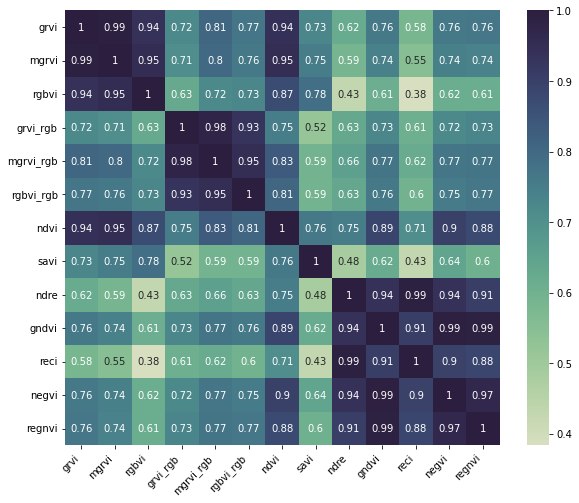

In [104]:
corr  = pd.concat(datacor).corr()

fig,ax = plt.subplots(figsize = (10,8))

ax = sns.heatmap(
    corr, 
    cmap=sns.cubehelix_palette(start=.5, rot=-.75, as_cmap=True),
    square=True,
    ax = ax,
    annot = True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
)

(<Figure size 720x720 with 10 Axes>,
 array([[<AxesSubplot:title={'center':'rgbvi'}>,
         <AxesSubplot:title={'center':'rgbvi_rgb'}>,
         <AxesSubplot:title={'center':'grvi_rgb'}>],
        [<AxesSubplot:title={'center':'savi'}>,
         <AxesSubplot:title={'center':'ndvi'}>,
         <AxesSubplot:title={'center':'ndre'}>],
        [<AxesSubplot:title={'center':'gndvi'}>, <AxesSubplot:>,
         <AxesSubplot:>]], dtype=object))

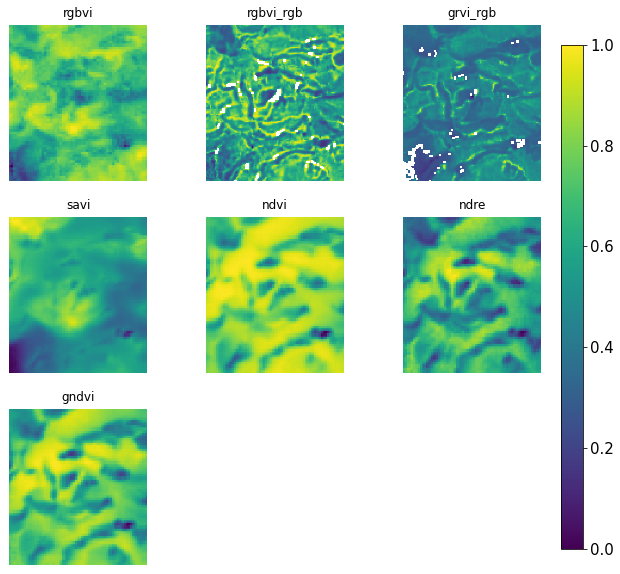

In [106]:
finallistvi = ['rgbvi', 'rgbvi_rgb', 'grvi_rgb','savi','ndvi', 'ndre', 'gndvi']


xrvi = xrtest.copy()
for vi in finallistvi:
    xrvi = calculate_vi_fromxarray(xrvi,vi = vi,expression = VEGETATION_INDEX[vi])

from drone_data.utils.plt_functions import plot_multibands

plot_multibands(xrvi.isel(date = 25)[finallistvi],num_columns=3,num_rows=3,minmaxscale=True)

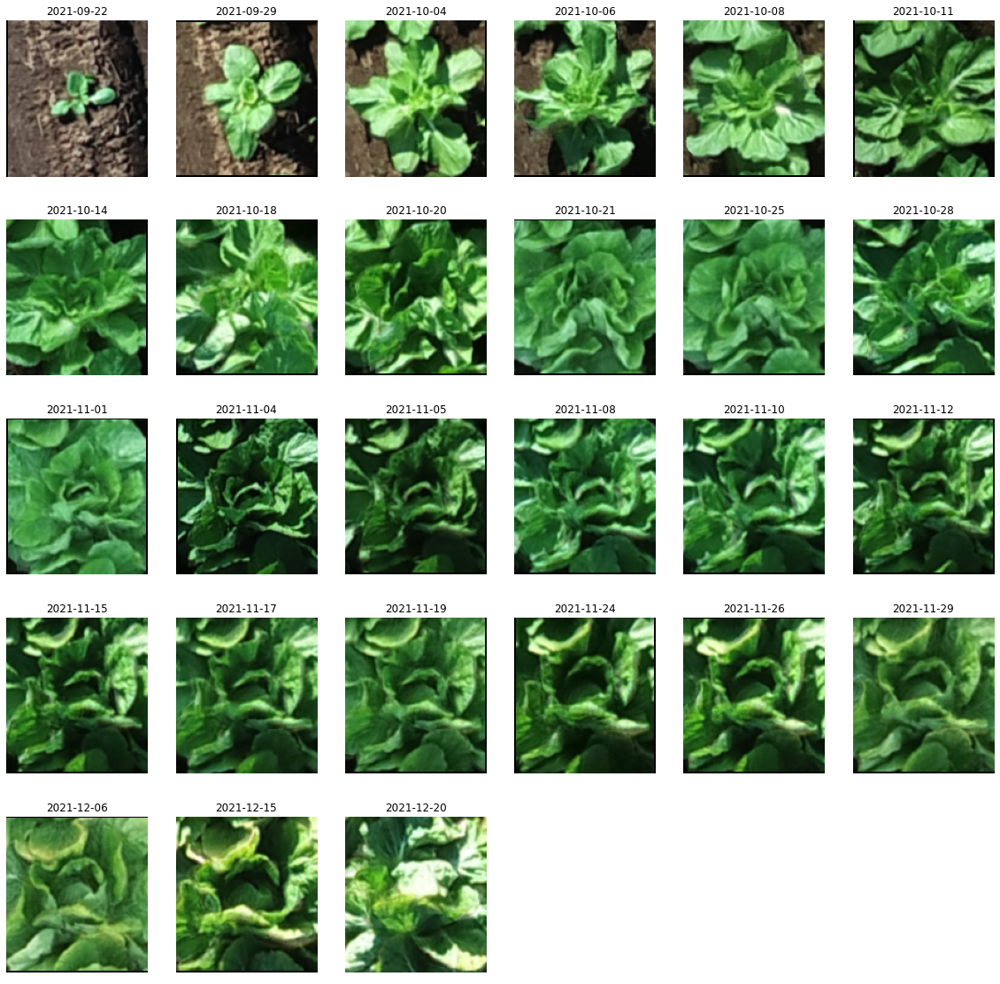

In [55]:
from utils.plt_functions import plot_multitemporal_rgb
f= plot_multitemporal_rgb(xrvi,nrows=5)

In [12]:
from utils.gis_functions import impute_4dxarray
from utils.xyz_functions import calculate_leaf_angle,get_baseline_altitude
xrtestdf = xrvi.copy().isel(date = 0).to_dataframe()
altref = xrtestdf.reset_index().loc[:,('x','y','z','red_3d','green_3d','blue_3d')].dropna()
bsl = get_baseline_altitude(altref, method='max_probability')

xrvi['z'] = (xrvi.z - bsl)*100
xrtest['z'] = xrvi.z.where(np.logical_or(np.isnan(xrtest.z),xrtest.z > 0 ), 0)

xrvi = impute_4dxarray(xrvi, bandstofill=['z'],nabandmaskname='red',n_neighbors=5)
xrvi = calculate_leaf_angle(xrvi, invert=True)


### Soil and shadow mask

In order to obtain only useful information that represents Chinese cabbage, it is necessary to remove those pixels that contain information related to soil or noise, represented in this case as shadows. Instead of using a supervised classification method, we proposed two different unsupervised methods. 1) using only vegetation index and height metrics, to remove soil, and 2) using rgb data to apply on them a histogram equalization.


These two k-means models will be trained with all the polygons/plants data after doing the preprocessing steps.


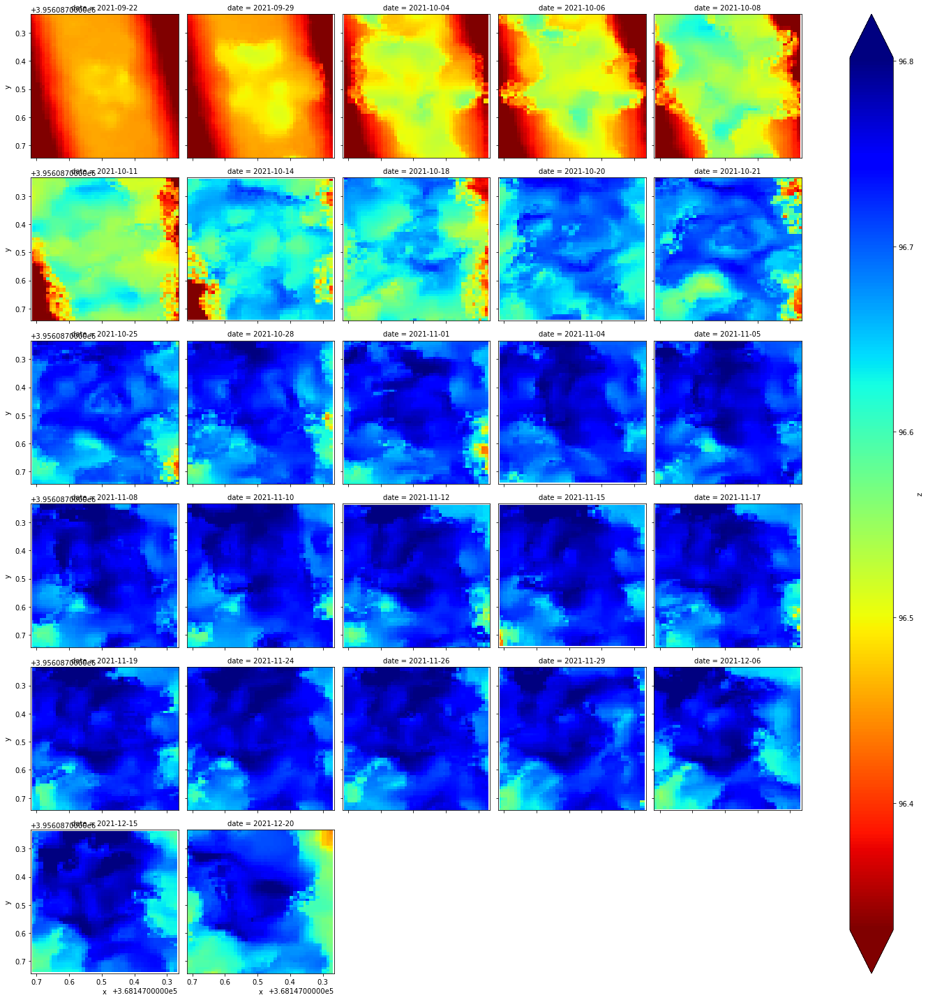

In [6]:
from drone_data.utils.plt_functions import plot_multitemporal_rgb

i = 852
xrfile = xrfiles[i]

with open(os.path.join(INPUTFOLDER,xrfile),"rb") as f:
    xrexample= pickle.load(f)


g = xrexample.z.plot.pcolormesh( "x",
"y", col="date", col_wrap=5, robust=True, cmap="jet_r",  figsize = [20,20],
cbar_kwargs={"label": "z"},
)
plt.gca().invert_yaxis()
plt.gca().invert_xaxis()


In [7]:
print('available variables {}'.format(list(xrexample.keys())))

available variables ['red', 'green', 'blue', 'blue_ms', 'green_ms', 'red_ms', 'edge', 'nir', 'z', 'red_3d', 'green_3d', 'blue_3d']


#### Extract data from a sample of polygons/plants

From each plant frames we will extract data realted to indexes like rgbvi ndvi savi ndre and gndvi, those indexes are commly sued for ccover classification. From the total of data acrros the time a 40 percent will be used for training the k means model. the k-means model was trained after scaling the initial data set using a  min max approach and after 

In [11]:
varnames = ['rgbvi','ndvi','savi', 'ndre', 'gndvi', 'z']

#finallistvi = ['rgbvi', 'rgbvi_rgb', 'grvi_rgb','savi','ndvi', 'ndre', 'gndvi']
finallistvi = ['rgbvi', 'savi','ndvi', 'ndre', 'gndvi']

listdf = []
persample = 80
seed=123

for i in tqdm.tqdm(range(0,len(xrfiles),3)):
    
    xrfile = xrfiles[i]
    
    with open(os.path.join(INPUTFOLDER,xrfile),"rb") as f:
        xrdata= pickle.load(f)
        
    xrtestvi = xrdata.copy()
    for vi in finallistvi:
        xrtestvi = calculate_vi_fromxarray(xrtestvi,vi = vi,expression = VEGETATION_INDEX[vi])

    xrsingle = xrtestvi[finallistvi].isel(date = DATESTOSELECT).copy()
    #xrsingle['plant'] = i
    xrdf = xrsingle.to_dataframe().dropna().drop(['spatial_ref'],axis = 1)

    nsample = int(np.round(xrdf.shape[0] * (persample / 100)))
    listdf.append(xrdf.sample(n=nsample, random_state=seed))
    
listdf = pd.concat(listdf)

100%|██████████| 385/385 [02:13<00:00,  2.89it/s]


#### K-means clustering

The process is done through several steps:
 - choosing a nnumber of clusters
 - data normalization
 - pca reduction
 - kmeans

In [12]:
from drone_data.utils.classification_functions import kmeans_images


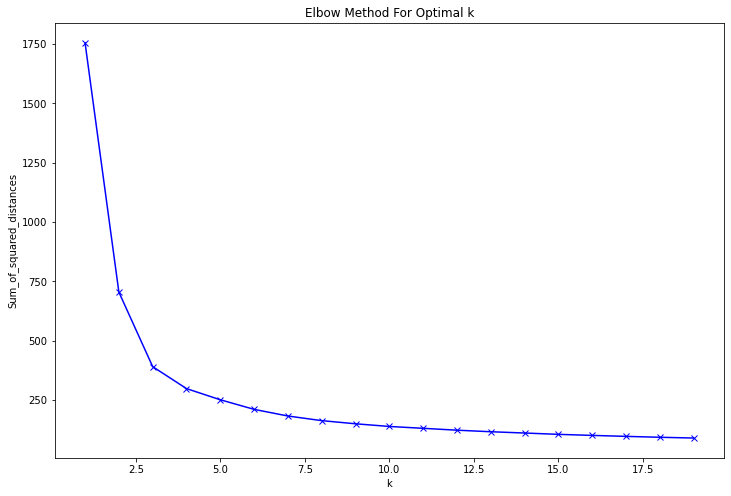

In [9]:

listdfsample = listdf.sample(n=10000, random_state=123)
Sum_of_squared_distances = []
K = range(1,20)
for k in K:
    Sum_of_squared_distances.append(
        kmeans_images(listdfsample.reset_index().drop(['x','y','date'],axis = 1).values, k)['kmeans_model'].inertia_)

plt.figure(figsize=(12,8))
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [10]:
listdf.reset_index().drop(['x','y','date'],axis = 1)

,rgbvi,savi,ndvi,ndre,gndvi
0,0.471118,0.420058,0.382362,0.033702,0.320778
1,0.815030,0.545567,0.756225,0.069316,0.479237
2,0.710360,0.776525,0.761432,0.116842,0.563547
3,0.836952,0.744327,0.922323,0.269498,0.799318
4,0.778442,0.575421,0.753331,0.066295,0.509432
...,...,...,...,...,...
114972278,0.697900,0.652606,0.705559,0.090102,0.522394
114972279,0.699137,0.488861,0.786430,0.138488,0.589196
114972280,0.760912,0.811992,0.833703,0.202829,0.666285
114972281,0.870310,0.784685,0.925536,0.240306,0.774525


In [13]:
kmeanmodel_soil =[]
#del listxarraycor_vi
nsample = int(np.round(listdf.shape[0] * (40 / 100)))
kmeanmodel_soil = kmeans_images(listdf.reset_index().drop(['x','y','date'],axis = 1),5, nrndsample=nsample, eigmin=0.6,export_pca=True,  verbose=True)

scale done!
kmeans training using a 45988913 x 2 matrix


In [14]:
#listdf['labels'] = kmeanmodel_soil['labels']
#listdf.head()
listdfsample = listdf.reset_index()#.sample(n=100000, random_state=123).copy()
listdfsample['labels'] = kmeanmodel_soil['labels'][listdfsample.index]
listdfsample = listdfsample.sample(n=30000, random_state=123)

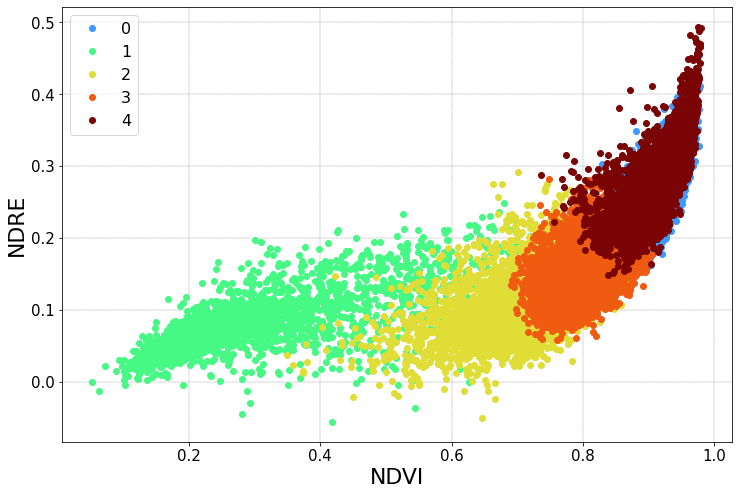

In [15]:
import matplotlib
cmap = matplotlib.cm.get_cmap('turbo', (len(np.unique(kmeanmodel_soil['labels']))+1))

groups = listdfsample.groupby("labels")
plt.figure(figsize=(12,8))
count = 1
for name, group in groups:
    
    plt.plot(group["ndvi"], group["ndre"], 
             marker="o", linestyle="", 
             label=name+0, color =matplotlib.colors.rgb2hex(cmap(count)))
    count+=1
#plt.ylim(-0.05, 0.5)
#plt.xlim(0.05, 1)
plt.xlabel('NDVI', fontsize=22)
plt.ylabel('NDRE', fontsize=22)
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)
plt.grid(color = 'gray', linestyle = '--', linewidth = 0.4)

plt.legend(fontsize=16)
#plt.savefig('../../../papers/chinese_cabbage_freshweigth_prediction/figures/figure3/kmeansregression_ndvi_ndre.jpg',dpi=1200)



#### cluster classification

In [16]:
from drone_data.utils.classification_functions import cluster_4dxarray
from drone_data.utils.plt_functions import plot_multitemporal_rgb
from drone_data.utils.gis_functions import impute_4dxarray
import matplotlib.pyplot as plt
import matplotlib
import pickle

In [33]:
xrfile = xrfiles[10]
with open(os.path.join(INPUTFOLDER,xrfile),"rb") as f:
    xrdata= pickle.load(f)

        
xrtestvi = xrdata.copy()
for vi in finallistvi:
    xrtestvi = calculate_vi_fromxarray(xrtestvi,vi = vi,expression = VEGETATION_INDEX[vi])

xrdatesoi = xrtestvi.isel(date = DATESTOSELECT).copy()

#xrtestfilled = impute_4dxarray(xrsingle, bandstofill=['rgbvi_rgb', 'grvi_rgb'],nabandmaskname='red',n_neighbors=5)
#xrsingle['plant'] = i

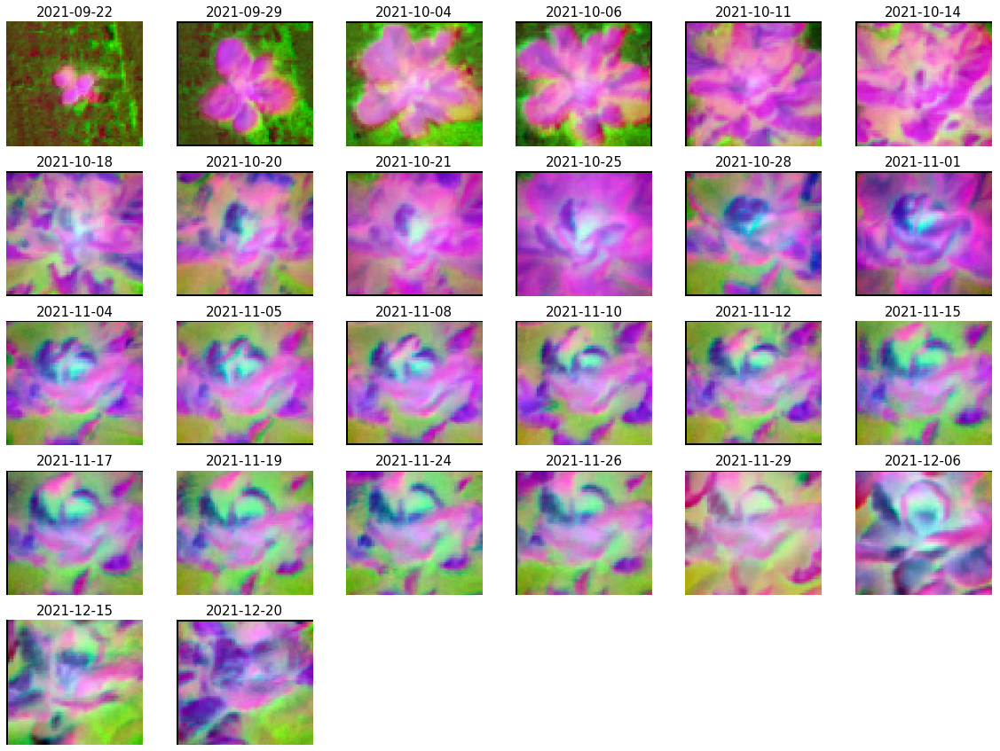

In [265]:
fig = plot_multitemporal_rgb(xrsingle, nrows= 5, figsize=(20,15),scale='minmax',
                             bands = ['rgbvi','ndre','savi'])


In [73]:
#fig, (ax1, ax2) = plt.subplots(figsize=(20,12), ncols=4,nrows=3)
import matplotlib.pyplot as plt
import numpy as np
#clvalue = 6
clvalue = 3
nrows = 5
ncols = 6

#xrfile = xrfiles[560]
#xrfile = xrfiles[125]
xrfile = xrfiles[256]
with open(os.path.join(INPUTFOLDER,xrfile),"rb") as f:
    xrdata= pickle.load(f)
        
xrtestvi = xrdata.copy()
for vi in finallistvi:
    xrtestvi = calculate_vi_fromxarray(xrtestvi,vi = vi,expression = VEGETATION_INDEX[vi])

xrtestvi = xrtestvi.isel(date = DATESTOSELECT).copy()

xrimage ,xrcluster = cluster_4dxarray(xrtestvi.copy(),cl_dict = kmeanmodel_soil, 
                                      cluster_value= 2, 
                                      only_thesedates=[0,1,2,3,4,5,6])




(<Figure size 864x576 with 11 Axes>,
 array([[<AxesSubplot:title={'center':'0'}>,
         <AxesSubplot:title={'center':'1'}>,
         <AxesSubplot:title={'center':'2'}>,
         <AxesSubplot:title={'center':'3'}>,
         <AxesSubplot:title={'center':'4'}>],
        [<AxesSubplot:title={'center':'5'}>,
         <AxesSubplot:title={'center':'6'}>, <AxesSubplot:>,
         <AxesSubplot:>, <AxesSubplot:>]], dtype=object))

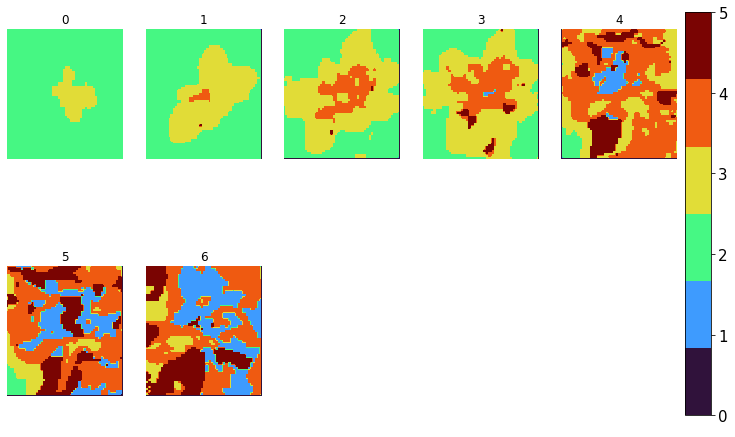

In [84]:

varnames = finallistvi
kmeanmodel_soil['variable_names'] = finallistvi

cmap = matplotlib.cm.get_cmap('turbo', (len(np.unique(kmeanmodel_soil['labels']))+1))
plot_multichanels(xrcluster.values, num_columns=5, num_rows=2, cmap = cmap, figsize=(12,8))


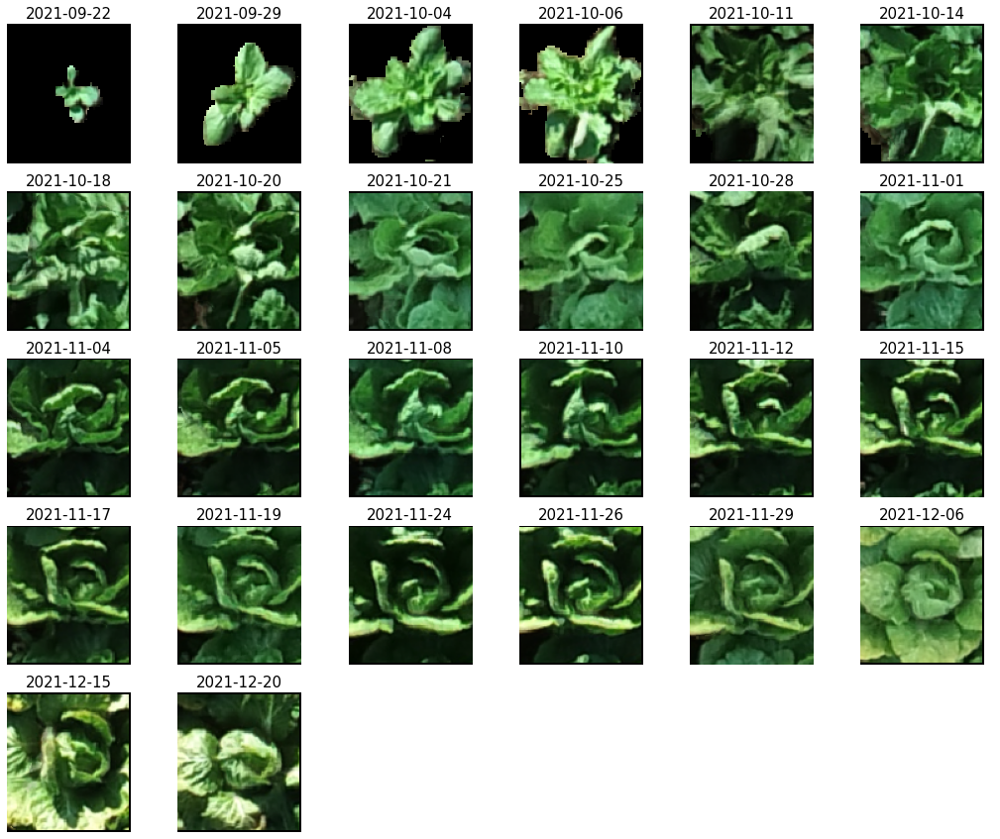

In [74]:
figtoexport = plot_multitemporal_rgb(xrimage, nrows= 5, figsize=(18,15))


### small pixels filtering

In [75]:
from drone_data.utils.xr_functions import filter_3Dxarray_contourarea

In [76]:

xrmasked = filter_3Dxarray_contourarea(xrimage.copy())

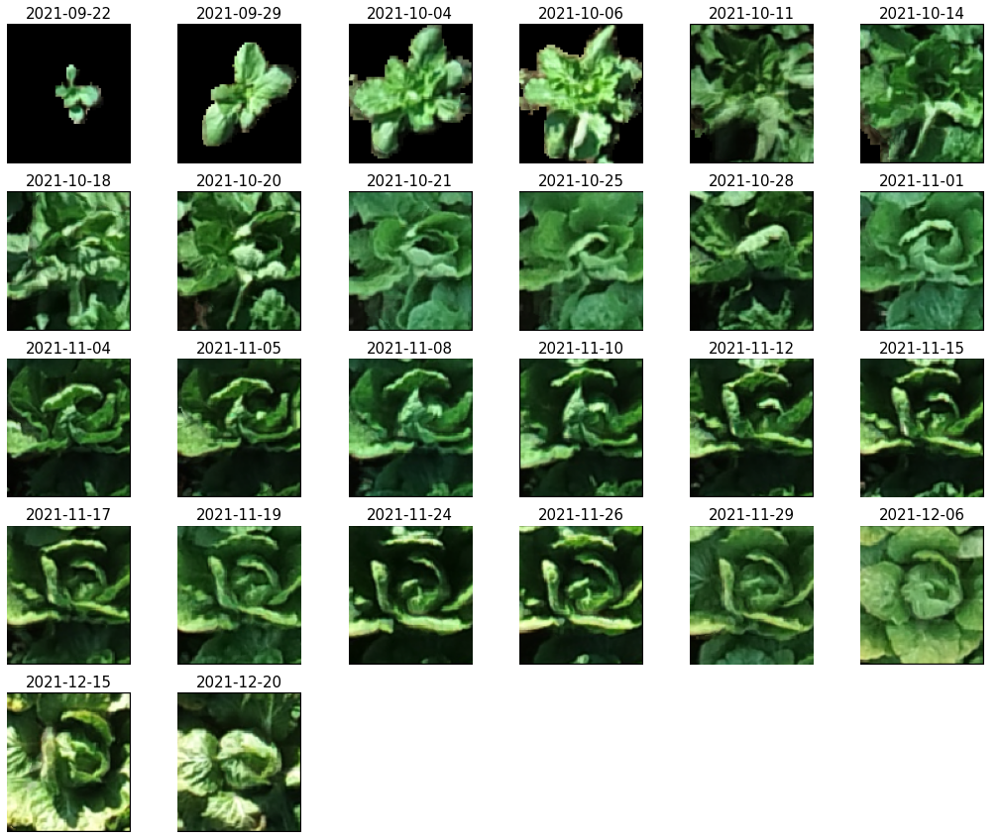

In [77]:
figtoexport = plot_multitemporal_rgb(xrmasked, nrows= 5, figsize=(18,15))

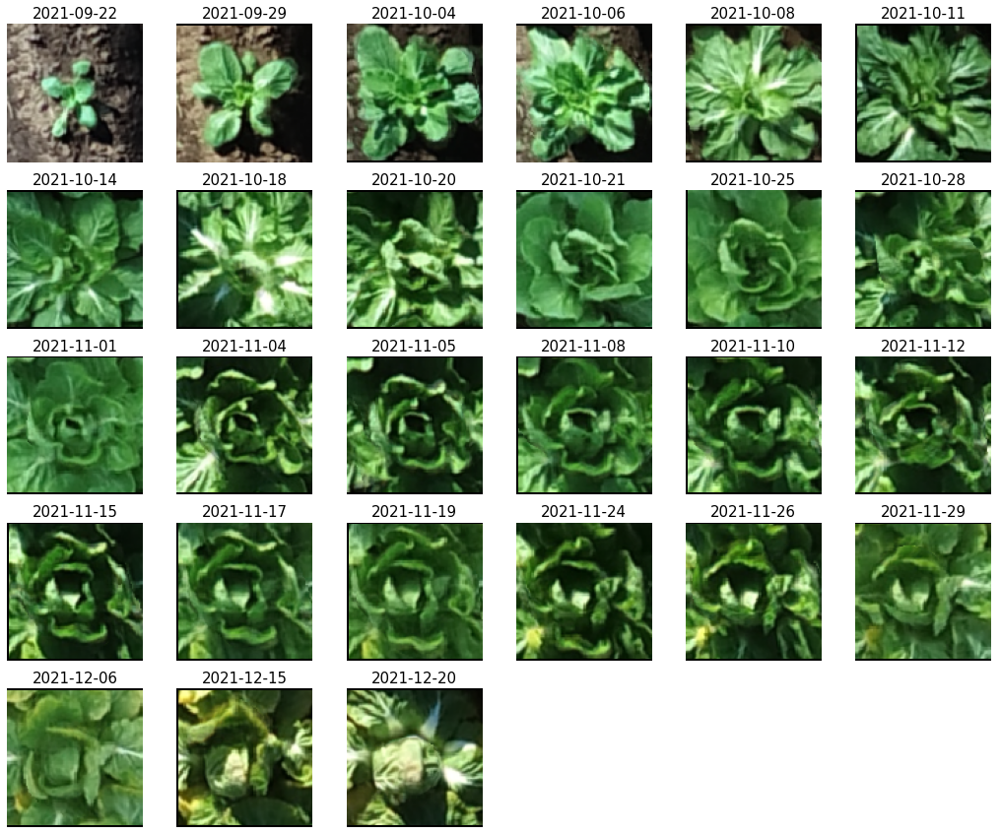

In [63]:
figtoexport = plot_multitemporal_rgb(xrdata, nrows= 5, figsize=(18,15))

In [89]:
figtoexport.savefig('../../../papers/chinese_cabbage_freshweigth_prediction/figures/figure3/kmeansfig_color3.jpg',dpi=1200)

In [85]:
kmeanmodel_soil['variable_names'] = finallistvi
kmeanmodel_soil['soil_cluster'] = 2

In [88]:
with open(SOILKMEANS, "wb") as f:
    pickle.dump(kmeanmodel_soil, f)

### image centering

In [90]:
from drone_data.utils.gis_functions import get_filteredimage

uavdatamasked_red = get_filteredimage(xrmasked, 
                                        heightvarname = 'z',
                                        red_perc = 70, 
                                        refimg = 0, 
                                        clip_xarray=True)

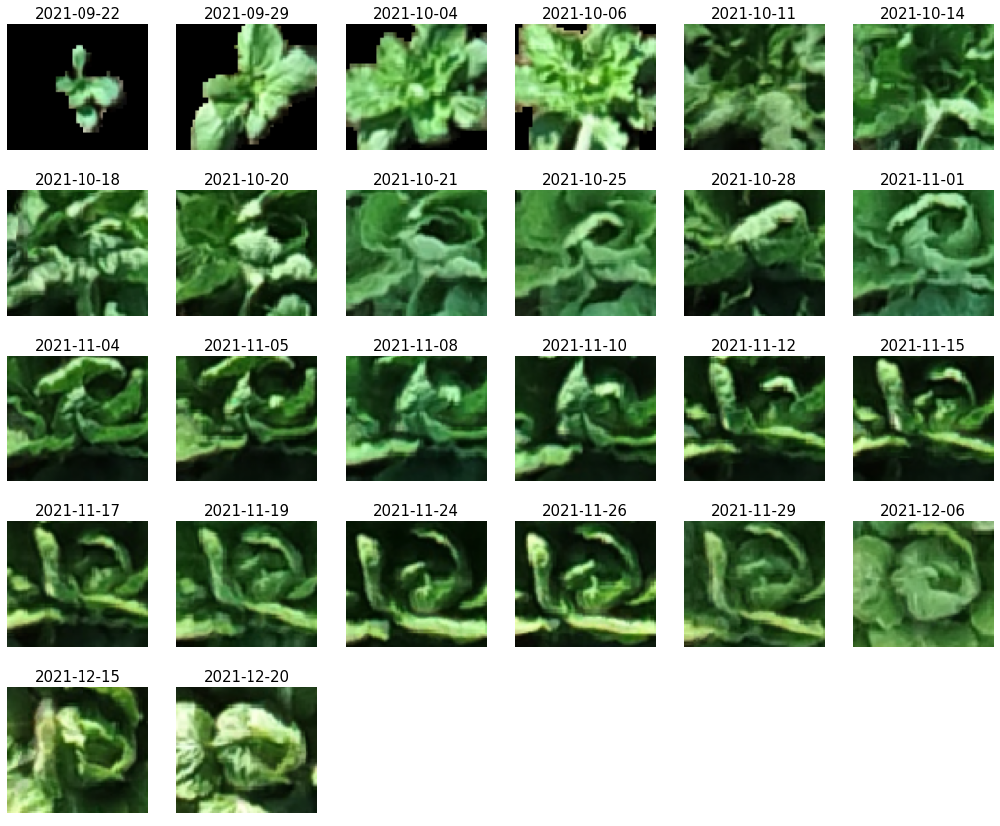

In [91]:
figtoexport = plot_multitemporal_rgb(uavdatamasked_red, nrows= 5, figsize=(18,15))